In [2]:
%load_ext autoreload
%autoreload 2
%cd /mnt/bd/janne-research-sm/samantha

/mnt/bd/janne-research-sm/samantha


/usr/local/lib/python3.9/dist-packages/IPython/core/magics/osm.py:417: UserWarning: using dhist requires you to install the `pickleshare` library.
  self.shell.db['dhist'] = compress_dhist(dhist)[-100:]


In [11]:
from recipes.research.dataset.collection import Billboardv2WebDataset
from samantha.data.audio.dataset import AudioFolderDataModule

batch_size = 8
segment_duration = 30
sample_rate = 44100
num_workers = 16
billboard = Billboardv2WebDataset(
  sample_rate=sample_rate,
  channels=2,
  segment_duration=segment_duration,
  resampled=True,
  shardshuffle=True,
)
datamodule = AudioFolderDataModule([billboard], [billboard], [billboard], weights=None, batch_size=batch_size, shuffle=None, num_workers=num_workers)
train_loader = iter(datamodule.train_dataloader())

2024-07-04 02:04:27,376 - samantha.utils.logger - WARNING - [rank: 0] * detected in url2index, doing glob:
2024-07-04 02:04:27,377 - samantha.utils.logger - WARNING - [rank: 0] url2index: ['/mnt/bd/billboard-44k/data/8/url2index.txt', '/mnt/bd/billboard-44k/data/1/url2index.txt', '/mnt/bd/billboard-44k/data/26/url2index.txt', '/mnt/bd/billboard-44k/data/25/url2index.txt', '/mnt/bd/billboard-44k/data/18/url2index.txt', '/mnt/bd/billboard-44k/data/17/url2index.txt', '/mnt/bd/billboard-44k/data/9/url2index.txt', '/mnt/bd/billboard-44k/data/3/url2index.txt', '/mnt/bd/billboard-44k/data/31/url2index.txt', '/mnt/bd/billboard-44k/data/12/url2index.txt', '/mnt/bd/billboard-44k/data/0/url2index.txt', '/mnt/bd/billboard-44k/data/30/url2index.txt', '/mnt/bd/billboard-44k/data/20/url2index.txt', '/mnt/bd/billboard-44k/data/15/url2index.txt', '/mnt/bd/billboard-44k/data/29/url2index.txt', '/mnt/bd/billboard-44k/data/19/url2index.txt', '/mnt/bd/billboard-44k/data/22/url2index.txt', '/mnt/bd/billboar

In [12]:
batch = next(train_loader)

In [13]:
from IPython.display import display, Audio

batch_idx = 4
n_frames = batch.segment_info[batch_idx].n_frames
display(Audio(batch.audio[batch_idx, :, :n_frames], rate=sample_rate))

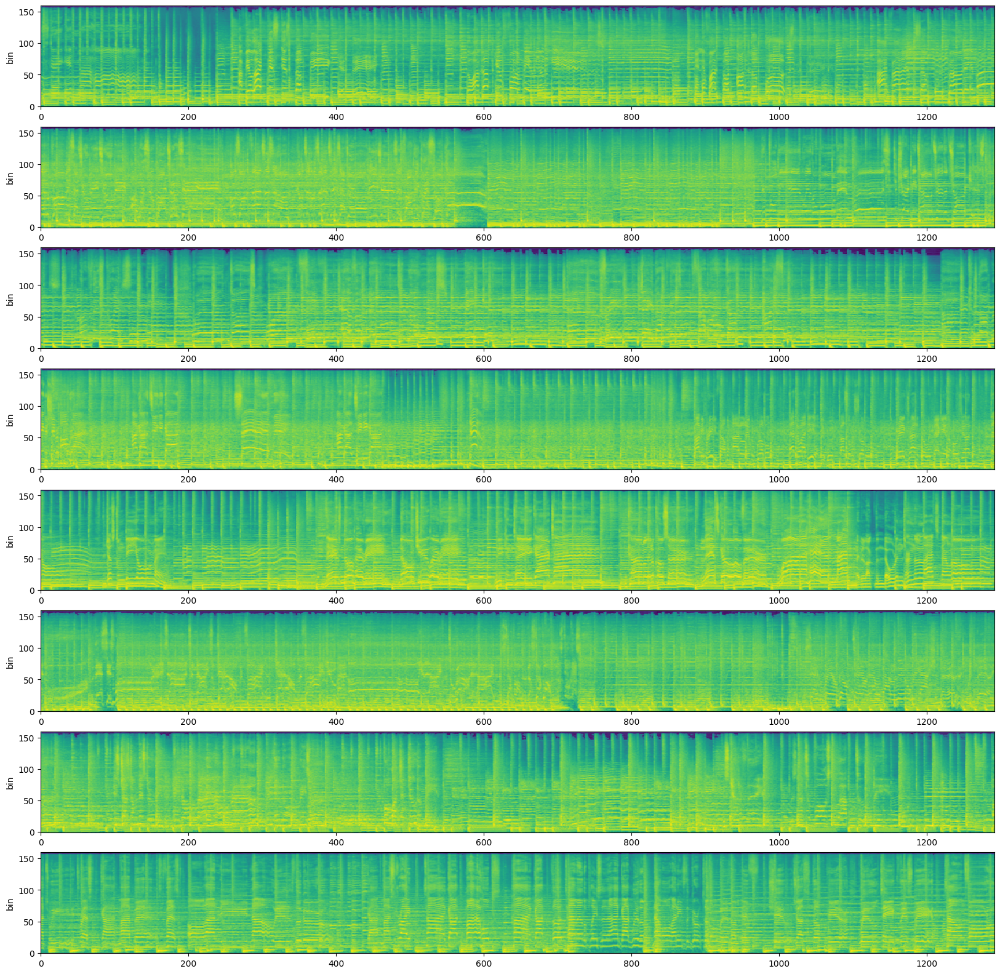

In [14]:
from samantha.transforms.audio import batch_plot_spectrogram, MelSpectrogram


mel_transform = MelSpectrogram(
    sample_rate=sample_rate,
    n_mels=160,
    n_fft=4096,
).to(batch.audio.device)

mel, _ = mel_transform(batch.audio.mean(dim=1))
batch_plot_spectrogram(mel.cpu(), plot_log=True, figsize=(20, 20))

In [15]:
# from pprint import pprint
# from recipes.research.diff.text_processor import (
#     SimpleTextProcessor,
#     WordProcessor,
# )

# words_processor = WordProcessor(min_word_len=3, seed=42)
# text_processor = SimpleTextProcessor(sample_n_keywords=0, sample_n_genres=4, sample_n_instruments=0, seed=42)
# genres = [", ".join(eval(i["genres"])) for i in batch.index]

# batch_genres = words_processor(genres, shuffle=False)

# batch_keywords = [None] * batch_size
# batch_instruments = [None] * batch_size
# batch_bpms = [None] * batch_size

# text = text_processor(batch_keywords, batch_genres, batch_instruments, batch_bpms)
# pprint(text)

In [ ]:
# from IPython.display import display, Audio

# batch_idx = 7
# n_frames = batch.segment_info[batch_idx].n_frames
# display(Audio(batch.audio[batch_idx, :, :n_frames], rate=sample_rate))